<a href="https://colab.research.google.com/github/WNderitu/data_science_capstone_project/blob/main/malaria_yolov8_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Plasmodium Vivax (malaria) parasite detector and counter**

- In this notebook, the number of images that will be used for training will be reduced to **300** and the proportion of validation images will also be reduced acoordingly.

- Since there is an issue of class imbalance in the original dataset, the train images that will be selected will not contain any images that contain only red blood cell annotations. This is to reduce the proportion of red blood cell class in the train set.


## **1.0 Introduction**

Malaria, a life-threatening disease caused by Plasmodium parasites transmitted by female Anopheles mosquitoes, is most commonly found in tropical and subtropical regions. In 2023, the African Region was home to 94% and 95% of malaria cases and deaths, respectively. Sub-Saharan Africa carries a disproportionately high share of the global malaria burden. Plasmodium vivax is one of the 5 parasites that cause malaria associated with disease relapses due to dormant liver stages, contributing significantly to morbidity.

The Plasmodium vivax lifecycle alternates between humans and Anopheles mosquitoes. Infection begins when a mosquito injects sporozoites into a human, which then move to the liver to either develop or remain dormant. Merozoites released from the liver infect red blood cells, progressing through ring, trophozoite, and schizont stages, causing malaria symptoms. Some parasites develop into gametocytes, enabling further transmission via mosquitoes.

Diagnosis of Plasmodium vivax malaria relies on examining stained blood smears via microsocopy and rapid diagnostic tests, with accurate detection being key to effective treatment and relapse prevention. Advanced methods like deep learning models, such as Regional Based CNN, YOLOv8, and others would offer improved reliability and efficiency in identifying infections.

## **1.1 Problem Statement**

The detection of Plasmodium vivax malaria remains challenging, primarily due to the morphological similarities between parasite stages and other blood components observed in microscopic images. Conventional microscopy is a labor-intensive process that is susceptible to human error and demands specialized expertise, which may be limited in under-resourced settings. Consequently, there is an urgent need for automated, efficient, and dependable solutions capable of detecting and quantifying Plasmodium vivax parasites and their developmental stages within blood smears. Such advancements would enhance diagnostic accuracy, promote effective treatment, and strengthen malaria control initiatives.

## **1.2 Objectives**



1.   To develop a computer vision model for object detection and counting
2.   To detect uninfected red blood cells and leukocytes in human blood cells in a microscopic image from a blood smear using the developed YOLOv8 model
3. To count the number of uninfected red blood cells and leukocytes in human blood cells in a microscpic image from a blood smear using the developed YOLOv8 model
4. To detect the growth stage of a Plasmodium Vivax (malaria parasite) in human blood cells in a microscopic image from a blood smear using the developed YOLOv8 model
5. To count the number of detected growth stages of the plasmodium vivax parasites per microscopic image using the developed YOLOv8 model

In [1]:
from google.colab import drive

# Mount Google Drive
try:
    drive.mount('/content/drive')
    print("Google Drive mounted successfully!")
except Exception as e:
    print(f"Error mounting Google Drive: {e}")

Mounted at /content/drive
Google Drive mounted successfully!


## **1.3 Installing & Importing Required Libraries**

In [2]:
!pip install matplotlib --quiet

In [3]:
!pip install Pillow #installing PILLOW LIBRARY

In [4]:
!pip install imagehash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 3.3 MB/s eta 0:00:00


In [5]:
!pip install pyyaml --quiet

In [2]:
import requests
import os
import json
import random
import shutil
from PIL import Image # Import Image to get image dimensions
from pprint import pprint # for
from PIL import ImageDraw, ImageFont
import matplotlib.pyplot as plt
from collections import Counter
import hashlib # find identical images
from collections import defaultdict
import numpy as np
import math # for
import yaml
from collections import Counter # Import Counter to get class counts
import shutil # for creating directories

## **1.4 Image dataset**

Dataset sourced from: https://bbbc.broadinstitute.org/BBBC041/

The dataset consists of:

image folder

training json file

test json file

The dataset consists of 1,328 microscopic images of blood smears

## **1.5 Extract malaria data from already downloaded zip file**

In [ ]:
import zipfile
import os

# Define the path to the downloaded zip file
zip_file_path = '/content/downloaded_data/malaria.zip'

# Defined directory to extract the contents
extract_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria'

# Create the extraction directory if it doesn't exist
os.makedirs(extract_dir, exist_ok=True)
print(f"Created extraction directory: {extract_dir}")

# Extract the contents of the zip file
try:
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)
    print(f"Successfully extracted {zip_file_path} to {extract_dir}")
except FileNotFoundError:
    print(f"Error: The zip file was not found at {zip_file_path}.")
except zipfile.BadZipFile:
    print(f"Error: The file {zip_file_path} is not a valid zip file.")
except Exception as e:
    print(f"An error occurred during extraction: {e}")

Created extraction directory: /content/drive/MyDrive/malaria_dataset_4/malaria
Successfully extracted /content/downloaded_data/malaria.zip to /content/drive/MyDrive/malaria_dataset_4/malaria


In [ ]:
# List contents of 'malaria' directory
extract_dir_drive = '/content/drive/MyDrive/malaria_dataset_4/malaria'

try:
    extracted_contents = os.listdir(extract_dir_drive)
    print(f"Contents of {extract_dir_drive}:")
    pprint(extracted_contents)
except FileNotFoundError:
    print(f"Error: The directory was not found at {extract_dir_drive}")
except Exception as e:
    print(f"An error occurred: {e}")

Contents of /content/drive/MyDrive/malaria_dataset_4/malaria:
['malaria', '__MACOSX']


In [ ]:
# List the contents of the 'malaria' directory in malaria
malaria_dir = os.path.join(extract_dir_drive, 'malaria')

try:
    malaria_contents = os.listdir(malaria_dir)
    print(f"Contents of {malaria_dir}:")
    pprint(malaria_contents) # Add closing parenthesis and pprint for better display
except FileNotFoundError:
    print(f"Error: The directory was not found at {malaria_dir}")
except Exception as e:
    print(f"An error occurred: {e}")

Contents of /content/drive/MyDrive/malaria_dataset_4/malaria/malaria:
['images', 'test.json', 'training.json']


## **1.6 Inspection image dataset & Data Preparation**

### 1.6.1 Check contents of json files

In [ ]:
# Check contents of train json file
train_json_path = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/training.json'

try:
    with open(train_json_path, 'r') as f:
        train_data = json.load(f)

    print(f"Contents of {train_json_path} (first entry):")
    if train_data:
        pprint(train_data[0])
    else:
        print("The train.json file is empty.")

except FileNotFoundError:
    print(f"Error: The file {train_json_path} was not found.")
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {train_json_path}. Please check the file format.")
except Exception as e:
    print(f"An error occurred: {e}")

Contents of /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/training.json (first entry):
{'image': {'checksum': '676bb8e86fc2dbf05dd97d51a64ac0af',
           'pathname': '/images/8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png',
           'shape': {'c': 1600, 'channels': 3, 'r': 1200}},
 'objects': [{'bounding_box': {'maximum': {'c': 1540, 'r': 1158},
                               'minimum': {'c': 1440, 'r': 1057}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1403, 'r': 971},
                               'minimum': {'c': 1303, 'r': 868}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1008, 'r': 689},
                               'minimum': {'c': 900, 'r': 578}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 713, 'r': 408},
                               'minimum': {'c': 611, 'r': 304}},
              'category': 'red blood cell'},
     

In [ ]:
# Check contents of test json file
test_json_path = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/test.json'

try:
    with open(test_json_path, 'r') as f:
        test_data = json.load(f)

    print(f"Contents of {train_json_path} (first entry):")
    if test_data:
        pprint(test_data[0])
    else:
        print("The test.json file is empty.")

except FileNotFoundError:
    print(f"Error: The file {test_json_path} was not found.")
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {test_json_path}. Please check the file format.")
except Exception as e:
    print(f"An error occurred: {e}")

Contents of /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/training.json (first entry):
{'image': {'checksum': 'eea3bfd6a929bcb06f9786667cd3fbb2',
           'pathname': '/images/41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg',
           'shape': {'c': 1944, 'channels': 3, 'r': 1383}},
 'objects': [{'bounding_box': {'maximum': {'c': 1883, 'r': 708},
                               'minimum': {'c': 1744, 'r': 576}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1373, 'r': 977},
                               'minimum': {'c': 1249, 'r': 863}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1711, 'r': 335},
                               'minimum': {'c': 1573, 'r': 210}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1253, 'r': 1142},
                               'minimum': {'c': 1124, 'r': 1017}},
              'category': 'red blood cell'},
  

### 1.6.2 Check numbers of test and train images

In [ ]:
# Get number of test and train images

# Assuming train_data and test_data are available from previous cell executions
if 'train_data' in locals():
    num_train_images = len(train_data)
    print(f"Number of images in the train dataset: {num_train_images}")
else:
    print("Train data not loaded. Please run the cell that loads 'train.json'.")
    num_train_images = 0

if 'test_data' in locals():
    num_test_images = len(test_data)
    print(f"Number of images in the test dataset: {num_test_images}")
else:
    print("Test data not loaded. Please run the cell that loads 'test.json'.")
    num_test_images = 0

total_images = num_train_images + num_test_images

if total_images > 0:
    train_proportion = num_train_images / total_images
    test_proportion = num_test_images / total_images
    print(f"\nProportion of train images: {train_proportion:.2f}")
    print(f"Proportion of test images: {test_proportion:.2f}")
else:
    print("\nNo images loaded to calculate proportions.")

Number of images in the train dataset: 1208
Number of images in the test dataset: 120

Proportion of train images: 0.91
Proportion of test images: 0.09


### 1.6.3 Check images containing only red blood cell annotations

Found 177 images with only red blood cell annotations.


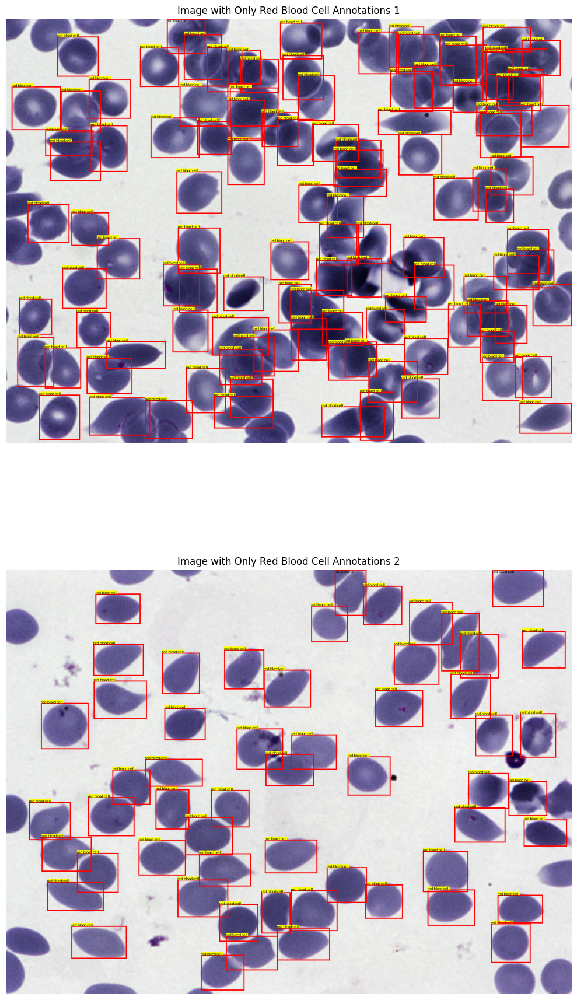

In [ ]:
# Define the path to the training JSON file
train_json_path = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/training.json'

# Define the base directory for images
image_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/images'

# Load the training data
try:
    with open(train_json_path, 'r') as f:
        train_data = json.load(f)
except FileNotFoundError:
    print(f"Error: The file {train_json_path} was not found.")
    train_data = []
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {train_json_path}. Please check the file format.")
    train_data = []
except Exception as e:
    print(f"An error occurred: {e}")
    train_data = []

# Filter images that contain only 'red blood cell' annotations
red_blood_cell_only_images = []
if train_data:
    for entry in train_data:
        categories_in_image = set()
        for obj in entry.get('objects', []):
            categories_in_image.add(obj['category'])

        # Check if the image contains only 'red blood cell' and has at least one object
        if 'red blood cell' in categories_in_image and len(categories_in_image) == 1 and len(entry.get('objects', [])) > 0:
            red_blood_cell_only_images.append(entry)

    print(f"Found {len(red_blood_cell_only_images)} images with only red blood cell annotations.")

    # Select a few random entries from the filtered list
    num_images_to_display = 2 # You can adjust this number
    if len(red_blood_cell_only_images) >= num_images_to_display:
        sample_entries = random.sample(red_blood_cell_only_images, num_images_to_display)
    else:
        sample_entries = red_blood_cell_only_images
        num_images_to_display = len(sample_entries)


    if sample_entries:
        plt.figure(figsize=(10, 10 * num_images_to_display)) # Adjust figure size for vertical layout

        for i, entry in enumerate(sample_entries):
            # Extract the image filename from the pathname
            image_pathname = os.path.basename(entry['image']['pathname'])
            # Construct the full image path by joining the base directory and the filename
            image_path = os.path.join(image_dir, image_pathname)


            try:
                img = Image.open(image_path).convert("RGB") # Convert to RGB
                draw = ImageDraw.Draw(img)

                # Draw bounding boxes and labels
                for obj in entry['objects']:
                    bbox = obj['bounding_box']
                    category = obj['category']
                    x_min = bbox['minimum']['c']
                    y_min = bbox['minimum']['r']
                    x_max = bbox['maximum']['c']
                    y_max = bbox['maximum']['r']

                    draw.rectangle([(x_min, y_min), (x_max, y_max)], outline="red", width=3)

                    text_color = "black"
                    box_color = "yellow"
                    try:
                        font = ImageFont.truetype("arial.ttf", 20)
                    except IOError:
                        font = ImageFont.load_default()

                    text_bbox = draw.textbbox((x_min, y_min), category, font=font)
                    text_width = text_bbox[2] - text_bbox[0]
                    text_height = text_bbox[3] - text_bbox[1]

                    text_box_coords = [(x_min, y_min - text_height), (x_min + text_width, y_min)]
                    text_box_coords[0] = (max(0, text_box_coords[0][0]), max(0, text_box_coords[0][1]))
                    text_box_coords[1] = (min(img.width, text_box_coords[1][0]), min(img.height, text_box_coords[1][1]))


                    draw.rectangle(text_box_coords, fill=box_color)
                    text_position = (text_box_coords[0][0], text_box_coords[0][1])
                    draw.text(text_position, category, fill=text_color, font=font)


                plt.subplot(num_images_to_display, 1, i + 1)
                plt.imshow(img)
                plt.title(f"Image with Only Red Blood Cell Annotations {i+1}")
                plt.axis('off')

            except FileNotFoundError:
                print(f"Error: Image file not found at {image_path}")
            except Exception as e:
                print(f"An error occurred while processing image {image_path}: {e}")

        plt.tight_layout()
        plt.show()

    else:
        print("No images found with only red blood cell annotations.")

else:
    print("No training data available to filter images.")

### 1.6.4 Reduce the number of train images

In [ ]:
# Step 1 - create train folder in malaria folder
# Define base directory for malaria dataset in Google Drive
base_image_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/images'

# Define the path for the new 'train' directory
train_image_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/train'

# Create the directory if it doesn't exist
os.makedirs(train_image_dir, exist_ok=True)

print(f"Created directory: {train_image_dir}")

Created directory: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/train


In [ ]:
# Step 2 - create labels folder in malaria folder

# Define the path for the new 'labels' directory
labels_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels'

# Create the directory if it doesn't exist
os.makedirs(labels_dir, exist_ok=True)

print(f"Created directory: {labels_dir}")

Created directory: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels


In [ ]:
# Define paths
original_train_json_path = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/training.json'
original_image_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/images'

# Verify the original_image_dir path and its contents
print(f"Verifying original image directory: {original_image_dir}")
if os.path.exists(original_image_dir):
    print("Directory exists.")
    # List a few items in the directory to check contents
    try:
        items_in_dir = os.listdir(original_image_dir)
        print(f"First 10 items in directory: {items_in_dir[:10]}")
    except Exception as e:
        print(f"Error listing directory contents: {e}")
else:
    print("Directory does NOT exist. Please check the path.")


# Define the target train image directory (created in the previous step)
target_train_image_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/train'

# Define the target directory for the new train.json subset
target_labels_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels'

# Ensure target directories exist
os.makedirs(target_train_image_dir, exist_ok=True)
os.makedirs(target_labels_dir, exist_ok=True)

# Load the original training data
try:
    with open(original_train_json_path, 'r') as f:
        original_train_data = json.load(f)
    print(f"Loaded {len(original_train_data)} original training entries from {original_train_json_path}.")
except FileNotFoundError:
    print(f"Error: The original train.json file was not found at {original_train_json_path}.")
    original_train_data = []
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {original_train_json_path}. Please check the file format.")
    original_train_data = []
except Exception as e:
    print(f"An error occurred loading {original_train_json_path}: {e}")
    original_train_data = []


# Filter out images that contain only 'red blood cell' annotations
filtered_train_data = []
if original_train_data:
    print("Filtering out images with only red blood cell annotations...")
    for entry in original_train_data:
        categories_in_image = set()
        for obj in entry.get('objects', []):
            categories_in_image.add(obj['category'])

        # Keep the image if it contains more than just 'red blood cell' OR if it has no objects
        # The requirement is to exclude images *with only* red blood cells.
        if not ('red blood cell' in categories_in_image and len(categories_in_image) == 1 and len(entry.get('objects', [])) > 0):
            filtered_train_data.append(entry)

    print(f"Filtered down to {len(filtered_train_data)} images after removing 'red blood cell' only images.")

else:
    print("No original training data available to filter.")


# Randomly select 386 images from the filtered list
desired_num_train_images = 386
selected_train_data = []
if filtered_train_data:
    if len(filtered_train_data) >= desired_num_train_images:
        selected_train_data = random.sample(filtered_train_data, desired_num_train_images)
        print(f"Randomly selected {len(selected_train_data)} images for the new training set.")
    else:
        selected_train_data = filtered_train_data
        print(f"Warning: Only {len(filtered_train_data)} images available after filtering. Using all available images.")
else:
    print("No filtered training data available to select from.")


# Copy selected images and create a new JSON file
new_train_json_data = []
if selected_train_data:
    print(f"Copying {len(selected_train_data)} images and preparing new train.json...")
    for entry in selected_train_data:
        image_pathname = entry['image']['pathname']
        # Construct the original image path by joining the original image directory and the pathname
        # Handle cases where pathname starts with '/images/'
        if image_pathname.startswith('/images/'):
            original_image_filename = image_pathname.replace('/images/', '', 1) # Remove the leading '/images/'
        else:
            original_image_filename = os.path.basename(image_pathname) # Just get the filename if it doesn't start with '/images/'

        original_image_path = os.path.join(original_image_dir, original_image_filename)

        image_filename = os.path.basename(image_pathname)
        target_image_path = os.path.join(target_train_image_dir, image_filename)

        try:
            # Copy the image file
            shutil.copy(original_image_path, target_image_path)
            # Add the entry to the new JSON data list
            new_train_json_data.append(entry)
        except FileNotFoundError:
            print(f"Warning: Original image file not found at {original_image_path}. Skipping copy and annotation for this entry.")
        except Exception as e:
            print(f"An error occurred while copying image {original_image_path}: {e}")

    print("Image copying complete.")

    # Save the new train.json file with annotations for the selected images
    new_train_json_path = os.path.join(target_labels_dir, 'train.json')
    try:
        with open(new_train_json_path, 'w') as f:
            json.dump(new_train_json_data, f, indent=4)
        print(f"New train.json with {len(new_train_json_data)} entries saved to: {new_train_json_path}")
    except Exception as e:
        print(f"Error saving new train.json: {e}")

else:
    print("No images selected to copy. New train.json will be empty.")

Verifying original image directory: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/images
Directory exists.
First 10 items in directory: ['002f20ad-2ace-499c-9335-c9080bc3e6b5.png', '003a89b0-a095-417a-8dd6-f408339bbc68.png', '003d1cdc-0aec-430b-90e0-f4d82135b1ac.png', '005e60b6-77b8-458c-b57c-bfe0c7e7df78.png', '00a02700-2ea2-4590-9e15-ffc9160fd3de.png', '00c8364b-8c85-4502-bcfe-64736fe76815.png', '00d04a90-80e5-4bce-9511-1b64eabb7a47.png', '010961af-b38c-49de-aca0-e3732d73d414.jpg', '0154dd8e-72f8-4d78-a4dd-93e139577bd1.png', '01b38a56-13eb-447b-89ee-fc21cb40dcc1.png']
Loaded 1208 original training entries from /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/training.json.
Filtering out images with only red blood cell annotations...
Filtered down to 1031 images after removing 'red blood cell' only images.
Randomly selected 386 images for the new training set.
Copying 386 images and preparing new train.json...
Image copying complete.
New train.json with 386 entries 

### **1.6.5 Create Validation images subset**

In [ ]:
# Define the base directory for the malaria dataset in Google Drive
base_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria'

# Define the path for the new 'val' directory
val_dir = os.path.join(base_dir, 'val')

# Create the directory if it doesn't exist
os.makedirs(val_dir, exist_ok=True)

print(f"Created validation directory: {val_dir}")

Created validation directory: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/val


In [ ]:
# Define paths
base_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria' # Adjusted to malaria_dataset_4
train_image_dir = os.path.join(base_dir, 'train')
val_image_dir = os.path.join(base_dir, 'val')
labels_dir = os.path.join(base_dir, 'labels')
train_json_path = os.path.join(labels_dir, 'train.json')
val_json_path = os.path.join(labels_dir, 'val.json') # Define path for new val.json

# Load the original training data
try:
    with open(train_json_path, 'r') as f:
        train_data = json.load(f)
except FileNotFoundError:
    print(f"Error: The original train.json file was not found at {train_json_path}. Cannot create validation set.")
    train_data = []
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {train_json_path}. Please check the file format.")
    train_data = []
except Exception as e:
    print(f"An error occurred loading {train_json_path}: {e}. Cannot create validation set.")
    train_data = []

# Ensure the validation image and label directories exist
os.makedirs(val_image_dir, exist_ok=True)
os.makedirs(labels_dir, exist_ok=True) # Ensure labels directory exists for val.json

# Determine the number of images to move to validation
desired_num_val_images = 86
# Ensure we don't try to move more than available in the current training data
num_images_to_move = min(desired_num_val_images, len(train_data))

print(f"Attempting to move {num_images_to_move} images to the validation set.")

# Randomly select images to move to validation
if num_images_to_move > 0:
    selected_entries_for_val = random.sample(train_data, num_images_to_move)

    print(f"Randomly selected {len(selected_entries_for_val)} images for validation.")

    # Create new lists for updated train and validation data
    updated_train_data = []
    val_data = []

    moved_count = 0
    # Move the selected images and their annotations
    for entry in train_data:
        image_pathname = entry['image']['pathname']
        image_filename = os.path.basename(image_pathname)
        original_image_path = os.path.join(train_image_dir, image_filename)
        target_image_path = os.path.join(val_image_dir, image_filename)

        # Check if this entry is one of the selected ones for validation
        if entry in selected_entries_for_val:
            try:
                # Move the image file
                shutil.move(original_image_path, target_image_path)
                # Add the entry to the validation data list
                val_data.append(entry)
                moved_count += 1
            except FileNotFoundError:
                print(f"Warning: Image file not found for moving at {original_image_path}. Skipping.")
            except Exception as e:
                print(f"An error occurred while moving image {original_image_path}: {e}")
        else:
            # If not selected for validation, keep it in the updated training data
            updated_train_data.append(entry)

    print(f"Successfully moved {moved_count} images to the validation set.")
    print(f"Remaining images in the training set: {len(updated_train_data)}")


    # Save the updated train.json file
    try:
        with open(train_json_path, 'w') as f:
            json.dump(updated_train_data, f, indent=4)
        print(f"Updated train.json saved to: {train_json_path}")
    except Exception as e:
        print(f"Error saving updated train.json: {e}")

    # Save the new val.json file
    try:
        with open(val_json_path, 'w') as f:
            json.dump(val_data, f, indent=4)
        print(f"New val.json with {len(val_data)} entries saved to: {val_json_path}")
    except Exception as e:
        print(f"Error saving new val.json: {e}")

else:
    print("No images selected to move to validation.")

Attempting to move 86 images to the validation set.
Randomly selected 86 images for validation.
Successfully moved 86 images to the validation set.
Remaining images in the training set: 300
Updated train.json saved to: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels/train.json
New val.json with 86 entries saved to: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels/val.json


**The reduced number of train and validation images will be used for training a YOLOv8 model until the best model is found.**

In [ ]:
# move test.json to labels folder
# Define the source and destination paths for test.json
original_test_json_path = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/test.json' # Original location of test.json
target_labels_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels' # Target directory for labels

# Ensure the target labels directory exists
os.makedirs(target_labels_dir, exist_ok=True)

# Define the target path for the test.json file
target_test_json_path = os.path.join(target_labels_dir, 'test.json')

# Move the test.json file
try:
    shutil.move(original_test_json_path, target_test_json_path)
    print(f"Successfully moved {original_test_json_path} to {target_test_json_path}")
except FileNotFoundError:
    print(f"Error: The file {original_test_json_path} was not found.")
except Exception as e:
    print(f"An error occurred while moving test.json: {e}")

Successfully moved /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/test.json to /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels/test.json


In [ ]:
# Define the base directory for the malaria dataset in Google Drive
base_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria'

# Define the path for the new 'test' directory
test_dir = os.path.join(base_dir, 'test')

# Create the directory if it doesn't exist
os.makedirs(test_dir, exist_ok=True)

print(f"Created test directory: {test_dir}")

Created test directory: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/test


In [ ]:
# Define base directories
base_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria'
original_image_dir = os.path.join(base_dir, 'images') # Original images directory
test_image_dir = os.path.join(base_dir, 'test') # New test images directory
test_json_path = os.path.join(base_dir, 'labels', 'test.json') # Path to test.json

# Ensure the test image directory exists
os.makedirs(test_image_dir, exist_ok=True)

# Load the test data to get image paths
try:
    with open(test_json_path, 'r') as f:
        test_data = json.load(f)
    print(f"Loaded {len(test_data)} test entries from {test_json_path}.")
except FileNotFoundError:
    print(f"Error: The test.json file was not found at {test_json_path}. Cannot copy test images.")
    test_data = []
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {test_json_path}. Please check the file format.")
    test_data = []
except Exception as e:
    print(f"An error occurred loading {test_json_path}: {e}. Cannot copy test images.")
    test_data = []

# Copy the test images
copied_count = 0
if test_data:
    print("Copying test images...")
    for entry in test_data:
        image_pathname = entry['image']['pathname']
        # Handle cases where pathname starts with '/images/'
        if image_pathname.startswith('/images/'):
            original_image_filename = image_pathname.replace('/images/', '', 1) # Remove the leading '/images/'
        else:
            original_image_filename = os.path.basename(image_pathname) # Just get the filename if it doesn't start with '/images/'

        original_image_path = os.path.join(original_image_dir, original_image_filename)
        target_image_path = os.path.join(test_image_dir, original_image_filename)

        try:
            shutil.copy(original_image_path, target_image_path)
            copied_count += 1
        except FileNotFoundError:
            print(f"Warning: Original image file not found at {original_image_path}. Skipping copy.")
        except Exception as e:
            print(f"An error occurred while copying image {original_image_path}: {e}")

    print(f"Successfully copied {copied_count} test images to {test_image_dir}")

else:
    print("No test data loaded. No images to copy.")

Loaded 120 test entries from /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels/test.json.
Copying test images...
Successfully copied 120 test images to /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/test


### **1.6.6 Load train, test and validation data and store in variables**

In [7]:
# Define the base directory for the malaria dataset in Google Drive
base_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria' # Changed to malaria_dataset_4
labels_dir = os.path.join(base_dir, 'labels')

# Define the paths to the JSON files
train_json_path = os.path.join(labels_dir, 'train.json')
test_json_path = os.path.join(labels_dir, 'test.json')
val_json_path = os.path.join(labels_dir, 'val.json')

# Load the train data
try:
    with open(train_json_path, 'r') as f:
        train_data = json.load(f)
    print(f"Loaded {len(train_data)} entries from train.json")
except FileNotFoundError:
    print(f"Error: The file {train_json_path} was not found.")
    train_data = []
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {train_json_path}. Please check the file format.")
    train_data = []
except Exception as e:
    print(f"An error occurred loading {train_json_path}: {e}")
    train_data = []

# Load the test data
try:
    with open(test_json_path, 'r') as f:
        test_data = json.load(f)
    print(f"Loaded {len(test_data)} entries from test.json")
except FileNotFoundError:
    print(f"Error: The file {test_json_path} was not found.")
    test_data = []
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {test_json_path}. Please check the file format.")
    test_data = []
except Exception as e:
    print(f"An error occurred loading {test_json_path}: {e}")
    test_data = []

# Load the validation data
try:
    with open(val_json_path, 'r') as f:
        val_data = json.load(f)
    print(f"Loaded {len(val_data)} entries from val.json")
except FileNotFoundError:
    print(f"Error: The file {val_json_path} was not found.")
    val_data = []
except json.JSONDecodeError:
    print(f"Error: Could not decode JSON from {val_json_path}. Please check the file format.")
    val_data = []
except Exception as e:
    print(f"An error occurred loading {val_json_path}: {e}")
    val_data = []

Error: The file /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels/train.json was not found.
Error: The file /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels/test.json was not found.
Error: The file /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels/val.json was not found.


### **1.6.7 View train images**

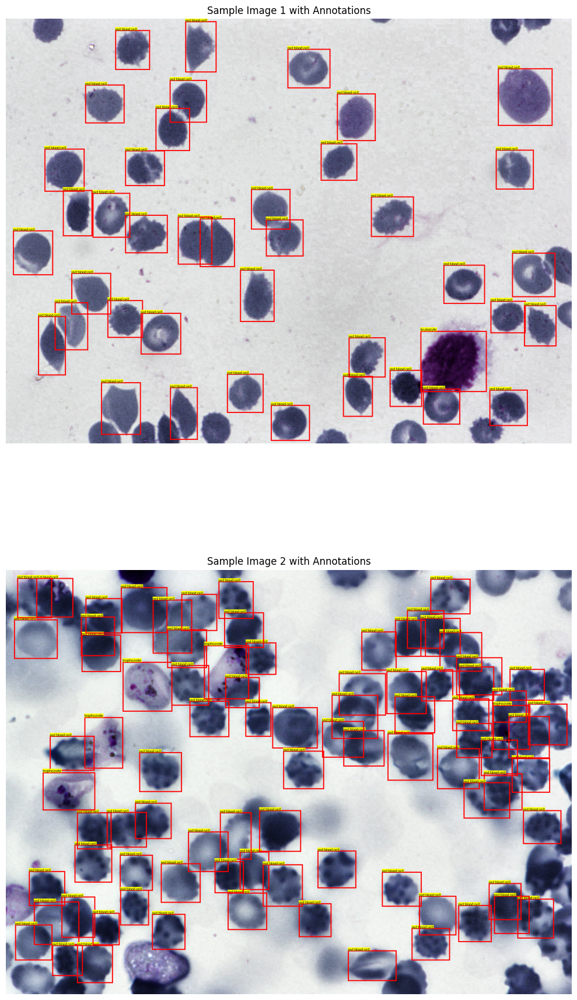

In [ ]:
# Select 2 random entries from the training data
num_images_to_display = 2
if len(train_data) >= num_images_to_display:
    sample_entries = random.sample(train_data, num_images_to_display)
else:
    sample_entries = train_data
    num_images_to_display = len(sample_entries)


image_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/images/train'

plt.figure(figsize=(10, 10 * num_images_to_display)) # Adjust figure size for vertical layout

for i, entry in enumerate(sample_entries):
    image_pathname = os.path.basename(entry['image']['pathname']) # Get just the filename
    # Construct the full image path by joining the corrected base directory and the filename
    image_path = os.path.join(image_dir, image_pathname)


    try:
        img = Image.open(image_path).convert("RGB") # Convert to RGB to ensure compatibility with drawing
        draw = ImageDraw.Draw(img)

        # Draw bounding boxes and labels
        for obj in entry['objects']:
            bbox = obj['bounding_box']
            category = obj['category']
            # The JSON uses 'c' for column (x) and 'r' for row (y)
            # PIL's bounding box is (x_min, y_min, x_max, y_max)
            x_min = bbox['minimum']['c']
            y_min = bbox['minimum']['r']
            x_max = bbox['maximum']['c']
            y_max = bbox['maximum']['r']

            # Draw rectangle
            draw.rectangle([(x_min, y_min), (x_max, y_max)], outline="red", width=3)

            # Draw label background
            text_color = "black"
            box_color = "yellow"
            try:
                # Attempt to use a common font
                font = ImageFont.truetype("arial.ttf", 20)
            except IOError:
                # Fallback to default PIL font if arial.ttf is not available
                font = ImageFont.load_default()


            # Use textbbox instead of textsize
            text_bbox = draw.textbbox((x_min, y_min), category, font=font)
            text_width = text_bbox[2] - text_bbox[0]
            text_height = text_bbox[3] - text_bbox[1]

            text_box_coords = [(x_min, y_min - text_height), (x_min + text_width, y_min)]
            draw.rectangle(text_box_coords, fill=box_color)

            # Draw label text
            draw.text((x_min, y_min - text_height), category, fill=text_color, font=font)


        plt.subplot(num_images_to_display, 1, i + 1) # display one image per row
        plt.imshow(img)
        plt.title(f"Sample Image {i+1} with Annotations")
        plt.axis('off') # Hide axes for cleaner image display

    except FileNotFoundError:
        print(f"Error: Image file not found at {image_path}")
    except Exception as e:
        print(f"An error occurred while processing image {image_path}: {e}")

plt.tight_layout()
plt.show()

### **1.6.8 Check for mislabelled images**

In [ ]:
# check mislabelled train images

# Collect all object categories
categories_list = []
for entry in train_data:
    for obj in entry['objects']:
        categories_list.append(obj['category'])

# Count the occurrences of each category
category_counts = Counter(categories_list)

print("Unique labels found in train dataset:", sorted(set(categories_list)))

# If you expect only these categories:
expected_labels = {'difficult','gametocyte','leukocyte', 'red blood cell', 'ring', 'schizont', 'trophozoite'}

# Check for unexpected labels
unexpected = [c for c in sorted(set(categories_list)) if c not in expected_labels]
if unexpected:
    print("Found unexpected or misspelled categories:", unexpected)
else:
    print("All labels match expected categories.")

Unique labels found in train dataset: ['difficult', 'gametocyte', 'leukocyte', 'red blood cell', 'ring', 'schizont', 'trophozoite']
All labels match expected categories.


In [ ]:
# check mislabelled test images

# Collect all object categories
categories_list = []
for entry in test_data:
    for obj in entry['objects']:
        categories_list.append(obj['category'])

# Count the occurrences of each category
category_counts = Counter(categories_list)

print("Unique labels found in test dataset:", sorted(set(categories_list)))


# If you expect only these categories:
expected_labels = {'difficult','gametocyte','leukocyte', 'red blood cell', 'ring', 'schizont', 'trophozoite'}

# Check for unexpected labels
unexpected = [c for c in sorted(set(categories_list)) if c not in expected_labels]
if unexpected:
    print("Found unexpected or misspelled categories:", unexpected)
else:
    print("All labels match expected categories.")

Unique labels found in test dataset: ['difficult', 'gametocyte', 'red blood cell', 'ring', 'schizont', 'trophozoite']
All labels match expected categories.


In [ ]:
# check mislabelled val images

# Collect all object categories
categories_list = []
for entry in val_data:
    for obj in entry['objects']:
        categories_list.append(obj['category'])

# Count the occurrences of each category
category_counts = Counter(categories_list)

print("Unique labels found in val dataset:", sorted(set(categories_list)))


# If you expect only these categories:
expected_labels = {'difficult','gametocyte','leukocyte', 'red blood cell', 'ring', 'schizont', 'trophozoite'}

# Check for unexpected labels
unexpected = [c for c in sorted(set(categories_list)) if c not in expected_labels]
if unexpected:
    print("Found unexpected or misspelled categories:", unexpected)
else:
    print("All labels match expected categories.")

Unique labels found in val dataset: ['difficult', 'gametocyte', 'leukocyte', 'red blood cell', 'ring', 'schizont', 'trophozoite']
All labels match expected categories.


### **1.6.9 Check for any bounding box issues**

In [ ]:
bad_boxes = []

for img_data in test_data:
    img_name = os.path.basename(img_data["image"]["pathname"])
    w = img_data["image"]["shape"]["c"]
    h = img_data["image"]["shape"]["r"]
    for obj in img_data["objects"]:
        box = obj["bounding_box"]
        xmin, ymin = box["minimum"]["c"], box["minimum"]["r"]
        xmax, ymax = box["maximum"]["c"], box["maximum"]["r"]
        if xmin >= xmax or ymin >= ymax:
            bad_boxes.append((img_name, "zero or negative box size"))
        elif xmin < 0 or ymin < 0 or xmax > w or ymax > h:
            bad_boxes.append((img_name, "box outside image bounds"))

print(f" Found {len(bad_boxes)} bounding box issues in test data.")
if bad_boxes:
    for i, (img, issue) in enumerate(bad_boxes[:10]):
        print(f"{i+1}. {img} → {issue}")

 Found 0 bounding box issues in test data.


In [ ]:
bad_boxes = []

for img_data in train_data:
    img_name = os.path.basename(img_data["image"]["pathname"])
    w = img_data["image"]["shape"]["c"]
    h = img_data["image"]["shape"]["r"]
    for obj in img_data["objects"]:
        box = obj["bounding_box"]
        xmin, ymin = box["minimum"]["c"], box["minimum"]["r"]
        xmax, ymax = box["maximum"]["c"], box["maximum"]["r"]
        if xmin >= xmax or ymin >= ymax:
            bad_boxes.append((img_name, "zero or negative box size"))
        elif xmin < 0 or ymin < 0 or xmax > w or ymax > h:
            bad_boxes.append((img_name, "box outside image bounds"))

print(f" Found {len(bad_boxes)} bounding box issues in train data.")
if bad_boxes:
    for i, (img, issue) in enumerate(bad_boxes[:10]):
        print(f"{i+1}. {img} → {issue}")

 Found 0 bounding box issues in train data.


In [ ]:
bad_boxes = []

for img_data in val_data:
    img_name = os.path.basename(img_data["image"]["pathname"])
    w = img_data["image"]["shape"]["c"]
    h = img_data["image"]["shape"]["r"]
    for obj in img_data["objects"]:
        box = obj["bounding_box"]
        xmin, ymin = box["minimum"]["c"], box["minimum"]["r"]
        xmax, ymax = box["maximum"]["c"], box["maximum"]["r"]
        if xmin >= xmax or ymin >= ymax:
            bad_boxes.append((img_name, "zero or negative box size"))
        elif xmin < 0 or ymin < 0 or xmax > w or ymax > h:
            bad_boxes.append((img_name, "box outside image bounds"))

print(f" Found {len(bad_boxes)} bounding box issues in val data.")
if bad_boxes:
    for i, (img, issue) in enumerate(bad_boxes[:10]):
        print(f"{i+1}. {img} → {issue}")

 Found 0 bounding box issues in val data.


### **1.6.10 Detect duplicate boxes on the same objec**t

In [ ]:
duplicates = []
for img_data in train_data:
    seen = set()
    img_name = os.path.basename(img_data["image"]["pathname"])
    for obj in img_data["objects"]:
        box = obj["bounding_box"]
        coords = (
            box["minimum"]["c"], box["minimum"]["r"],
            box["maximum"]["c"], box["maximum"]["r"]
        )
        if coords in seen:
            duplicates.append(img_name)
        else:
            seen.add(coords)

duplicates = list(set(duplicates))
print(f" Found {len(duplicates)} images with duplicate bounding boxes in train subset.")
if duplicates:
    print("Examples:", duplicates[:10])

 Found 0 images with duplicate bounding boxes in train subset.


In [ ]:
duplicates = []
for img_data in test_data:
    seen = set()
    img_name = os.path.basename(img_data["image"]["pathname"])
    for obj in img_data["objects"]:
        box = obj["bounding_box"]
        coords = (
            box["minimum"]["c"], box["minimum"]["r"],
            box["maximum"]["c"], box["maximum"]["r"]
        )
        if coords in seen:
            duplicates.append(img_name)
        else:
            seen.add(coords)

duplicates = list(set(duplicates))
print(f" Found {len(duplicates)} images with duplicate bounding boxes in test subset.")
if duplicates:
    print("Examples:", duplicates[:10])

 Found 0 images with duplicate bounding boxes in test subset.


In [ ]:
duplicates = []
for img_data in val_data:
    seen = set()
    img_name = os.path.basename(img_data["image"]["pathname"])
    for obj in img_data["objects"]:
        box = obj["bounding_box"]
        coords = (
            box["minimum"]["c"], box["minimum"]["r"],
            box["maximum"]["c"], box["maximum"]["r"]
        )
        if coords in seen:
            duplicates.append(img_name)
        else:
            seen.add(coords)

duplicates = list(set(duplicates))
print(f" Found {len(duplicates)} images with duplicate bounding boxes in val subset.")
if duplicates:
    print("Examples:", duplicates[:10])

 Found 0 images with duplicate bounding boxes in val subset.


### **1.6.11 Check for class imbalance**

Object category distribution in training data:
Counter({'red blood cell': 18752,
         'trophozoite': 456,
         'ring': 111,
         'difficult': 109,
         'gametocyte': 44,
         'schizont': 44,
         'leukocyte': 25})


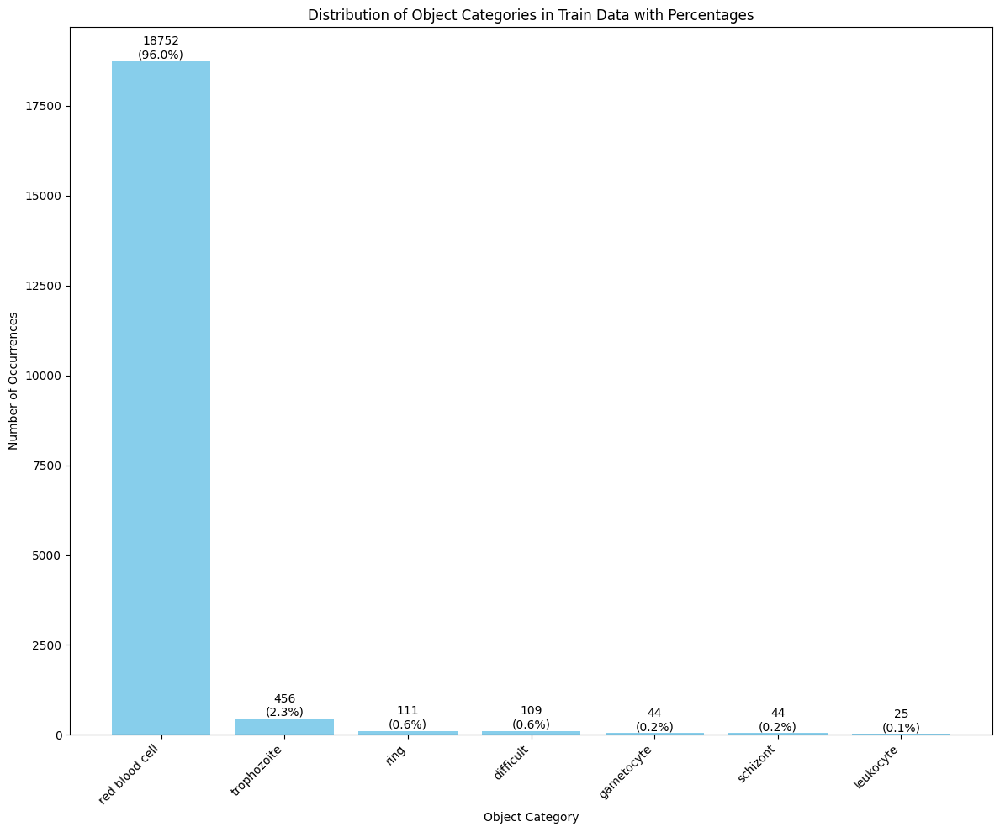

In [ ]:
# check class imbalance in train data

# Collect all object categories
categories_list = []
for entry in train_data:
    for obj in entry['objects']:
        categories_list.append(obj['category'])

# Count the occurrences of each category
category_counts = Counter(categories_list)

print("Object category distribution in training data:")
pprint(category_counts)

# Sort categories and counts in descending order of counts
sorted_counts = dict(category_counts.most_common())
categories = list(sorted_counts.keys())
counts = list(sorted_counts.values())

# Calculate total count for percentages
total_count = sum(counts)

# Create a bar plot
plt.figure(figsize=(12, 10))
bars = plt.bar(categories, counts, color='skyblue')
plt.xlabel("Object Category")
plt.ylabel("Number of Occurrences")
plt.title("Distribution of Object Categories in Train Data with Percentages")
plt.xticks(rotation=45, ha='right') # Rotate labels for better readability

# Add text annotations for counts and percentages
for bar in bars:
    yval = bar.get_height()
    percentage = (yval / total_count) * 100 if total_count > 0 else 0
    plt.text(bar.get_x() + bar.get_width()/2, yval,
             f'{yval}\n({percentage:.1f}%)',
             va='bottom', ha='center', rotation=0, fontsize=10) # Adjust va, ha, rotation, and fontsize as needed

plt.tight_layout() # Adjust layout to prevent labels overlapping
plt.show()

**Red blood cells** are the most frequent category, making up a very large percentage of the total objects.

The next most frequent category is **trophozoite**, but its count is significantly lower than that of red blood cells.

The remaining categories, including difficult, ring, schizont, gametocyte, and leukocyte, have much lower counts compared to red blood cells and trophozoites.

There is **imbalance in the dataset** at the object level with a disproportionately high number of red blood cells compared to the other categories, especially the different stages of the malaria parasite (trophozoite, ring, schizont, gametocyte). Therefore this imbalance will have to be handled before model training to ensure the model can effectively detect the less frequent classes.

A combination of different types of **data augmentation, use of weighted loss function or focal Loss** will likely be effective strategies.

In [ ]:
# Compute imbalance ratio = max_count / min_count

# Assuming category_counts is available from a previous cell's execution (from analyzing train data)

if 'category_counts' in locals() and category_counts:
    # Get the counts of all categories
    counts = list(category_counts.values())

    if counts:
        # Find the maximum and minimum counts
        max_count = max(counts)
        min_count = min(counts)

        # Avoid division by zero if the minimum count is zero
        if min_count > 0:
            imbalance_ratio = max_count / min_count
            print(f"Maximum object count: {max_count}")
            print(f"Minimum object count: {min_count}")
            print(f"Imbalance ratio (max_count / min_count): {imbalance_ratio:.2f}")
        else:
            print("Cannot compute imbalance ratio: Minimum count is zero (at least one class has no instances).")
            # Optionally, you could filter out classes with zero count before finding the minimum
            # non_zero_counts = [c for c in counts if c > 0]
            # if non_zero_counts:
            #     min_count = min(non_zero_counts)
            #     imbalance_ratio = max_count / min_count
            #     print(f"Imbalance ratio (excluding classes with zero count): {imbalance_ratio:.2f}")
            # else:
            #      print("No classes with non-zero counts found.")
    else:
        print("No object counts found to compute imbalance ratio.")
else:
    print("Object category counts for training data not found. Please run the cell that generates 'category_counts' first.")

Maximum object count: 5855
Minimum object count: 6
Imbalance ratio (max_count / min_count): 975.83


Test data

Object category distribution in testing data:
Counter({'red blood cell': 5614,
         'ring': 169,
         'trophozoite': 111,
         'gametocyte': 12,
         'schizont': 11,
         'difficult': 5})


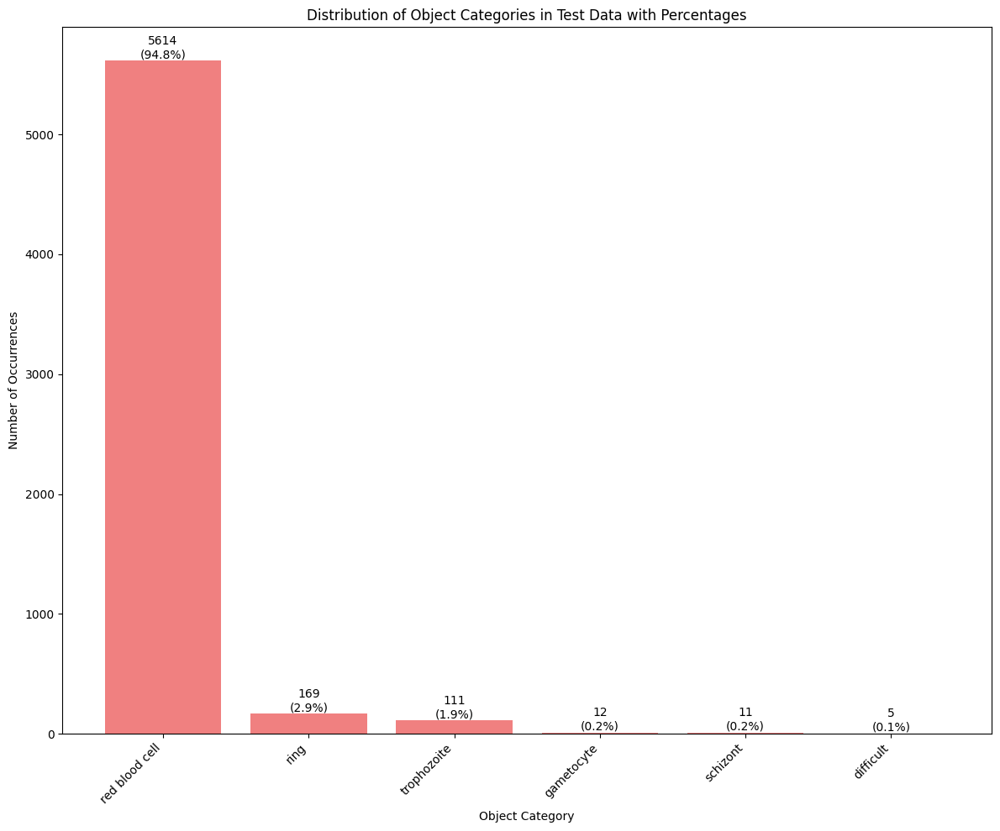

In [ ]:
# Check class imbalance in test data

# Collect all object categories
categories_list = []
for entry in test_data:
    for obj in entry['objects']:
        categories_list.append(obj['category'])

# Count the occurrences of each category
category_counts = Counter(categories_list)

print("Object category distribution in testing data:")
pprint(category_counts)

# Optional: Create a bar plot for test data distribution
if category_counts:
    # Sort categories and counts in descending order of counts
    sorted_counts = dict(category_counts.most_common())
    categories = list(sorted_counts.keys())
    counts = list(sorted_counts.values())

    # Calculate total count for percentages
    total_count = sum(counts)

    plt.figure(figsize=(12, 10))
    bars = plt.bar(categories, counts, color='lightcoral')
    plt.xlabel("Object Category")
    plt.ylabel("Number of Occurrences")
    plt.title("Distribution of Object Categories in Test Data with Percentages")
    plt.xticks(rotation=45, ha='right') # Rotate labels for better readability

    # Add text annotations for counts and percentages
    for bar in bars:
        yval = bar.get_height()
        percentage = (yval / total_count) * 100 if total_count > 0 else 0
        plt.text(bar.get_x() + bar.get_width()/2, yval,
                 f'{yval}\n({percentage:.1f}%)',
                 va='bottom', ha='center', rotation=0, fontsize=10) # Adjust va, ha, rotation, and fontsize as needed

    plt.tight_layout() # Adjust layout to prevent labels overlapping
    plt.show()
else:
    print("No object categories found in test data to plot.")

The plot for the test data distribution, similar to the training data, shows a significant class imbalance.

Red blood cells are the most numerous category by a large margin, similar to the training data.
The counts for the other categories (ring, trophozoite, gametocyte, schizont, and difficult) are considerably lower than that of red blood cells.
The malaria parasite stages (ring, trophozoite, gametocyte, and schizont) are minority classes in the test set as well.
The category 'leukocyte' is present in the training data but appears to be absent in the test data, or its count is very low (it's not shown in the plotted categories, likely due to having 0 or very few instances).

val data

Object category distribution in validation data:
Counter({'red blood cell': 5855,
         'trophozoite': 100,
         'difficult': 42,
         'ring': 26,
         'schizont': 10,
         'gametocyte': 9,
         'leukocyte': 6})


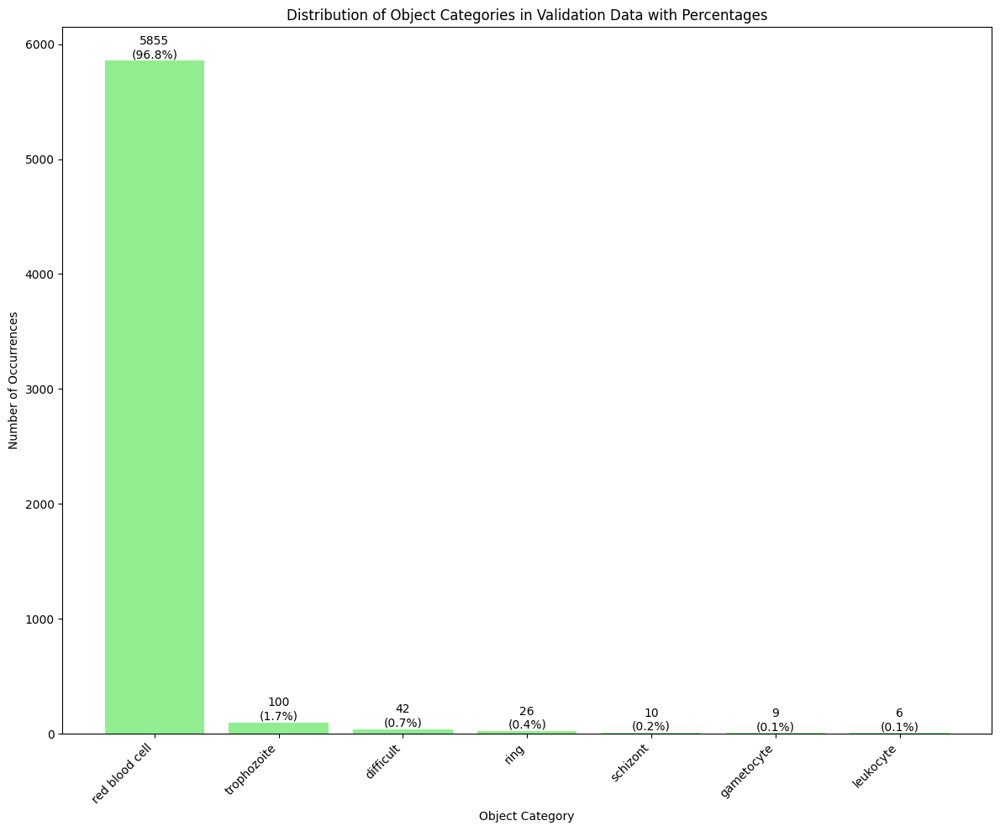

In [ ]:
# check distribution of classes in validation images

# Collect all object categories
categories_list = []
for entry in val_data:
    for obj in entry['objects']:
        categories_list.append(obj['category'])

# Count the occurrences of each category
category_counts = Counter(categories_list)

print("Object category distribution in validation data:")
pprint(category_counts)

# Optional: Create a bar plot for validation data distribution
if category_counts:
    # Sort categories and counts in descending order of counts
    sorted_counts = dict(category_counts.most_common())
    categories = list(sorted_counts.keys())
    counts = list(sorted_counts.values())

    # Calculate total count for percentages
    total_count = sum(counts)

    plt.figure(figsize=(12, 10))
    bars = plt.bar(categories, counts, color='lightgreen')
    plt.xlabel("Object Category")
    plt.ylabel("Number of Occurrences")
    plt.title("Distribution of Object Categories in Validation Data with Percentages")
    plt.xticks(rotation=45, ha='right') # Rotate labels for better readability

    # Add text annotations for counts and percentages
    for bar in bars:
        yval = bar.get_height()
        percentage = (yval / total_count) * 100 if total_count > 0 else 0
        plt.text(bar.get_x() + bar.get_width()/2, yval,
                 f'{yval}\n({percentage:.1f}%)',
                 va='bottom', ha='center', rotation=0, fontsize=10) # Adjust va, ha, rotation, and fontsize as needed

    plt.tight_layout() # Adjust layout to prevent labels overlapping
    plt.show()
else:
    print("No object categories found in validation data to plot.")

same comment as for test and train data

--- **Distribution of the number of objects per train image** ---

Distribution of the number of objects per training image:
Images with 9 objects: 2
Images with 12 objects: 1
Images with 18 objects: 1
Images with 19 objects: 1
Images with 22 objects: 1
Images with 23 objects: 2
Images with 24 objects: 3
Images with 25 objects: 5
Images with 26 objects: 3
Images with 27 objects: 2
Images with 28 objects: 2
Images with 29 objects: 4
Images with 30 objects: 2
Images with 31 objects: 3
Images with 32 objects: 3
Images with 33 objects: 2
Images with 34 objects: 3
Images with 35 objects: 3
Images with 36 objects: 5
Images with 37 objects: 4
Images with 38 objects: 3
Images with 39 objects: 3
Images with 40 objects: 4
Images with 41 objects: 3
Images with 42 objects: 6
Images with 43 objects: 7
Images with 44 objects: 5
Images with 45 objects: 8
Images with 46 objects: 7
Images with 47 objects: 4
Images with 48 objects: 5
Images with 49 objects: 6
Images with 50 objects: 5
Images with 51 objects: 10
Images with 52 objects: 2
Images with 53 objects: 4
Images

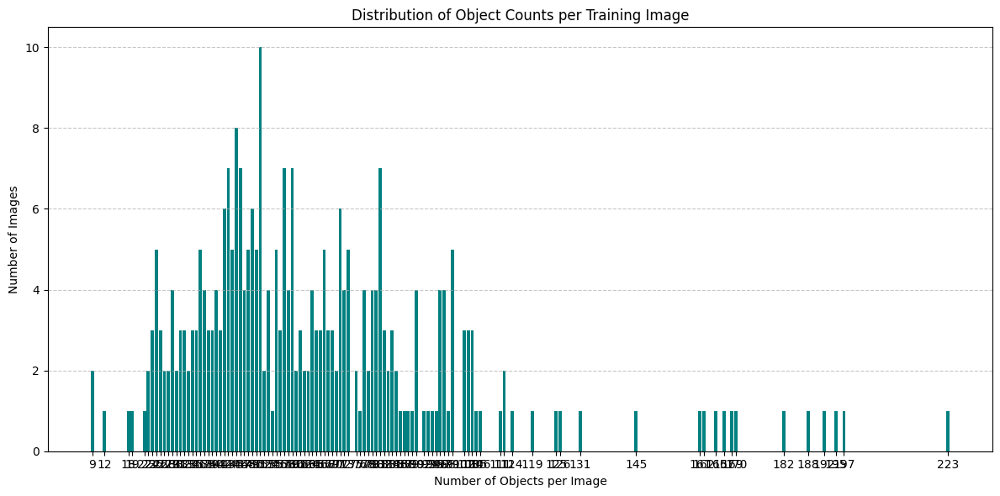

In [ ]:
# Assuming train_data is loaded from a previous cell

if train_data:
    object_counts_per_image = []
    for entry in train_data:
        object_counts_per_image.append(len(entry.get('objects', [])))

    # Count the occurrences of each object count
    count_distribution = Counter(object_counts_per_image)

    print("Distribution of the number of objects per training image:")
    # Sort by the number of objects for better readability
    sorted_counts = sorted(count_distribution.items())
    for num_objects, count in sorted_counts:
        print(f"Images with {num_objects} objects: {count}")

    # Plot the distribution
    if count_distribution:
        plt.figure(figsize=(12, 6))
        counts = [count for num_objects, count in sorted_counts]
        num_objects = [num_objects for num_objects, count in sorted_counts]

        plt.bar(num_objects, counts, color='teal')
        plt.xlabel("Number of Objects per Image")
        plt.ylabel("Number of Images")
        plt.title("Distribution of Object Counts per Training Image")
        plt.xticks(num_objects) # Ensure all object counts are shown on x-axis
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()
    else:
        print("No object counts found in training data to plot.")

else:
    print("No training data available to check object counts.")

The spread to the right shows there are some images with very high object counts (over 100 or even 200 objects per image), though these are much fewer.

The few bars on the far left represent sparse images — those with very few detectable objects.

The dataset is imbalanced in object density:

Many images have moderate object counts (20–50).

A small number have extremely dense object counts (>150).

This imbalance can affect YOLO training:

Images with too many objects may dominate loss computation or slow convergence.

Sparse images contribute less to gradient updates.

## **1.7 Data preprocessing**

### **1.7.1 Creating class weights that will be used in the model during training to handle class imbalance**

In [ ]:
# Collect all object categories from the training data
categories_list = []
for entry in train_data:
  for obj in entry.get('objects', []):
    categories_list.append(obj['category'])

    # Count the occurrences of each category
    category_counts = Counter(categories_list)

    # print("Object category distribution in training data:")
    # # Print sorted counts for clarity
    # pprint(dict(category_counts.most_common()))


# Define the class mapping (should match the one used for YOLO conversion)
# Ensure this order is consistent with your YOLO data.yaml file
class_names = ['red blood cell', 'trophozoite', 'ring', 'schizont', 'gametocyte', 'leukocyte', 'difficult']
num_classes = len(class_names)

# Initialize class weights array using total number of instances divided by the count of each class (inverse frequency)
total_instances = sum(category_counts.values())
if total_instances == 0:
    print("No objects found in training data. Cannot compute class weights.")
    class_weights_array = None
else:
    # Calculate inverse frequency weights (Total Instances / Class Count)
    # Use 1 for classes not in data to avoid division by zero, although they won't appear in category_counts if data is loaded
    class_weights = {cls: total_instances / category_counts.get(cls, 1) for cls in class_names}


    # Convert to a list in the order defined by class_names
    class_weights_array = [class_weights.get(cls, 1.0) for cls in class_names] # Use 1.0 as default for classes not found


    print("\nComputed Class Weights (Inverse Frequency):")
    print(class_weights_array)

    # You can optionally print the weights mapped to class names for clarity
    print("\nClass Weights by Name:")
    for i, cls in enumerate(class_names):
        print(f"{cls}: {class_weights_array[i]:.2f}")


Computed Class Weights (Inverse Frequency):
[1.0420755119453924, 42.853070175438596, 176.04504504504504, 444.1136363636364, 444.1136363636364, 781.64, 179.27522935779817]

Class Weights by Name:
red blood cell: 1.04
trophozoite: 42.85
ring: 176.05
schizont: 444.11
gametocyte: 444.11
leukocyte: 781.64
difficult: 179.28


### **1.7.2 Convert JSON Annotations to YOLO Format**

In [ ]:
# Step 1: Convert JSON Annotations to YOLO Format

# Define the base directory for the dataset in Google Drive
base_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria'

# Define paths to image and label directories
image_dirs = {
    'train': os.path.join(base_dir, 'images', 'train'),
    'val': os.path.join(base_dir, 'images', 'val'),
    'test': os.path.join(base_dir, 'images', 'test')
}

label_json_paths = {
    'train': os.path.join(base_dir, 'labels', 'train', 'train.json'),
    'val': os.path.join(base_dir, 'labels', 'val', 'val.json'),
    'test': os.path.join(base_dir, 'labels', 'test', 'test.json')
}

yolo_label_dirs = {
    'train': os.path.join(base_dir, 'labels', 'train'),
    'val': os.path.join(base_dir, 'labels', 'val'),
    'test': os.path.join(base_dir, 'labels', 'test')
}

# Ensure the YOLO label directories exist
for dataset_type in yolo_label_dirs:
    os.makedirs(yolo_label_dirs[dataset_type], exist_ok=True)


# Define the mapping from category name to class ID
# Ensure the order matches the desired class order for YOLOv8
class_mapping = {
    'red blood cell': 0,
    'trophozoite': 1,
    'ring': 2,
    'schizont': 3,
    'gametocyte': 4,
    'leukocyte': 5,
    'difficult': 6 # 'difficult' objects are often included but might be ignored during training/evaluation depending on configuration
}

print("Starting annotation conversion to YOLO format...")


for dataset_type, json_path in label_json_paths.items():
    print(f"\nConverting annotations for {dataset_type} dataset...")
    try:
        with open(json_path, 'r') as f:
            annotations_data = json.load(f)
    except FileNotFoundError:
        print(f"Error: Annotation file not found at {json_path}. Skipping {dataset_type} conversion.")
        continue
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from {json_path}. Skipping {dataset_type} conversion.")
        continue
    except Exception as e:
        print(f"An error occurred loading {json_path}: {e}. Skipping {dataset_type} conversion.")
        continue


    image_count = 0
    for entry in annotations_data:
        image_pathname = os.path.basename(entry['image']['pathname'])
        image_path = os.path.join(image_dirs[dataset_type], image_pathname)

        # Get image dimensions
        try:
            with Image.open(image_path) as img:
                img_w, img_h = img.size
        except FileNotFoundError:
            print(f"Warning: Image file not found for {image_pathname} at {image_path}. Skipping its annotations.")
            continue
        except Exception as e:
            print(f"Error opening image file {image_path}: {e}. Skipping its annotations.")
            continue

        # Define the path for the YOLO format label file
        label_filename = os.path.splitext(image_pathname)[0] + '.txt'
        yolo_label_path = os.path.join(yolo_label_dirs[dataset_type], label_filename)

        # Write annotations to the YOLO format file
        with open(yolo_label_path, 'w') as f:
            for obj in entry.get('objects', []):
                category = obj['category']
                bbox = obj['bounding_box']

                # Get class ID
                class_id = class_mapping.get(category)
                if class_id is None:
                    print(f"Warning: Unknown category '{category}' in {image_pathname}. Skipping object.")
                    continue # Skip object if category is not in mapping

                # Get bounding box coordinates
                xmin = bbox['minimum']['c']
                ymin = bbox['minimum']['r']
                xmax = bbox['maximum']['c']
                ymax = bbox['maximum']['r']

                # Calculate YOLO format coordinates (normalized center_x, center_y, width, height)
                center_x = (xmin + xmax) / 2.0
                center_y = (ymin + ymax) / 2.0
                width = xmax - xmin
                height = ymax - ymin

                # Normalize coordinates
                # Ensure image dimensions are not zero to avoid division by zero
                if img_w > 0 and img_h > 0:
                    center_x_norm = center_x / img_w
                    center_y_norm = center_y / img_h
                    width_norm = width / img_w
                    height_norm = height / img_h

                    # Write to file in YOLO format
                    f.write(f"{class_id} {center_x_norm:.6f} {center_y_norm:.6f} {width_norm:.6f} {height_norm:.6f}\n")
                else:
                    print(f"Warning: Image {image_pathname} has zero dimensions. Cannot normalize bounding boxes. Skipping annotations for this image.")


        image_count += 1
    print(f"Converted annotations for {image_count} images in the {dataset_type} dataset.")

print("\nAnnotation conversion complete.")

Starting annotation conversion to YOLO format...

Converting annotations for train dataset...
Converted annotations for 300 images in the train dataset.

Converting annotations for val dataset...
Converted annotations for 86 images in the val dataset.

Converting annotations for test dataset...
Converted annotations for 120 images in the test dataset.

Annotation conversion complete.


### **1.7.3 Creation of YOLO Data Configuration File**

In [ ]:
# Step 1: Create YOLO Data Configuration File

# Define the base directory for the dataset in Google Drive
base_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria'

# Define the paths for the train and validation image and label directories
train_img_dir = os.path.join(base_dir, 'images', 'train')
val_img_dir = os.path.join(base_dir, 'images', 'val')
train_label_dir = os.path.join(base_dir, 'labels', 'train')
val_label_dir = os.path.join(base_dir, 'labels', 'val')

# Define the class names in the desired order (matching the class_mapping used in the conversion script)
class_names = ['red blood cell', 'trophozoite', 'ring', 'schizont', 'gametocyte', 'leukocyte', 'difficult']
num_classes = len(class_names)

# Create the data dictionary for the YAML file
data = {
    'train': train_img_dir,
    'val': val_img_dir,
    'nc': num_classes,  # Number of classes
    'names': class_names # List of class names
}

# Check if class_weights_array is available and add it to the data dictionary
if 'class_weights_array' in locals() and class_weights_array:
    data['cls_weights'] = class_weights_array
    print("✅ Added class weights to the YAML data dictionary.")
else:
    print("⚠️ class_weights_array not found. Class weights will not be added to the YAML unless defined elsewhere.")


# Define the path where the YAML file will be saved in Google Drive
yaml_file_path = os.path.join(base_dir, 'malaria_dataset_4.yaml')

try:
    with open(yaml_file_path, 'w') as f:
        yaml.dump(data, f, default_flow_style=False)
    print(f" YOLO data configuration (with potentially added weights) saved at: {yaml_file_path}")
except Exception as e:
    print(f"Error creating YOLO data configuration file: {e}")

✅ Added class weights to the YAML data dictionary.
 YOLO data configuration (with potentially added weights) saved at: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/malaria_dataset_4.yaml


In [ ]:
# show the content of the YAML file

# Define the path to the YAML file in Google Drive
yaml_file_path = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/malaria_dataset_4.yaml'

# Read and print the content of the YAML file
try:
    with open(yaml_file_path, 'r') as f:
        yaml_content = f.read()
    print(yaml_content)
except FileNotFoundError:
    print(f"Error: The file {yaml_file_path} was not found.")
except Exception as e:
    print(f"An error occurred while reading the file: {e}")

cls_weights:
- 1.0420755119453924
- 42.853070175438596
- 176.04504504504504
- 444.1136363636364
- 444.1136363636364
- 781.64
- 179.27522935779817
names:
- red blood cell
- trophozoite
- ring
- schizont
- gametocyte
- leukocyte
- difficult
nc: 7
train: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/images/train
val: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/images/val



## **1.7 Model Training & Evaluation**

I'll start with the smallest version/size of YOLOv8n. Then I will train a YOLOv8s, then a YOLOv8m.

In addition different parameters will be indicated in the model.train() to ensure class imbalance is handled.

In [3]:
# --- Step 1: Install ultralytics
!pip install ultralytics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.3 MB/s eta 0:00:00


### **1.7.1 Train with small train dataset

In [4]:
# --- Step 1: Import dependencies
from ultralytics import YOLO
import torch
import os # Import os for path joining
import pandas as pd # Import pandas for logging metrics

# --- Step 1: Define paths
yaml_path = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/malaria_dataset_4.yaml' # Use the correct path to the YAML with class weights
save_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria_yolov8n_train_results'
run_name = 'malaria_yolov8n_train_1'

# --- Step 2: Initialize YOLO model
model = YOLO('yolov8n.pt')  # 'yolov8n.pt' balances accuracy and speed; good for mid-sized datasets

# --- Step 3: Define and apply class weights (to handle dataset imbalance)
# Assuming class_weights_array is available from a previous cell's execution
if 'class_weights_array' in locals() and class_weights_array is not None:
    # Class weights are typically applied as a loss function parameter, not directly to model.model.loss_class_weights in train() args
    # They are often set within the model configuration or handled internally by the trainer when passed correctly.
    # The `cls_weights` argument in train() is the correct way to pass them.
    print("✅ Class weights have been added to the YAML and will be used.")
else:
    print("⚠️ class_weights_array not found or is None. Class weights will NOT be applied.")
    class_weights_array = None # Ensure it's None if not found

# --- Step 2: Train model with detailed hyperparameters
results = model.train(
    data=yaml_path,          # path to dataset YAML file (defines classes & image paths)
    imgsz=640,               # input image size (higher = better accuracy but more GPU memory)
    epochs=300,              # number of runs
    batch=16,                # number of images per batch (adjust if GPU memory runs out)
    lr0=0.001,               # initial learning rate
    device=0,                # use GPU 0 (Colab assigns one GPU per runtime)
    optimizer='AdamW',       # AdamW - Adam with decoupled Weight decay. Helps generalization and reduces overfitting.
    mosaic=1.0,              # data augmentation: combines 4 images into one
    mixup=0.5,               # augmentation: blends images to improve robustness
    copy_paste=0.5,          # augmentation: copies and pastes objects between images
    multi_scale=True,        # random image resizing factor; improves multi-scale detection ability
    hsv_h=0.03,              # augmentation: hue shift
    hsv_s=1.0,               # augmentation: saturation shift
    hsv_v=0.7,               # augmentation: brightness shift
    degrees=10.0,            # augmentation: random rotation
    translate=0.1,           # augmentation: random translation
    scale=0.5,               # augmentation: random scaling
    shear=2.0,               # augmentation: random shearing
    perspective=0.0005,      # augmentation: random perspective
    flipud=0.5,              # augmentation: random flip up-down
    fliplr=0.5,              # augmentation: random flip left-right
    project=save_dir,        # base directory to save training results
    name=run_name,           # folder name for this run (appears under project dir)
    exist_ok=True,           # allows reusing folder if it exists (prevents crash)
    verbose=True,            # print detailed logs during training
    cls=True,                # enable class-specific weights. Enables class-specific loss weighting, meaning classes with fewer samples get proportionally higher weight to reduce imbalance effects.
    patience=20
)

print("\nTraining complete.")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
⚠️ class_weights_array not found or is None. Class weights will NOT be applied.
Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=True, compile=False, conf=None, copy_paste=0.5, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/malaria_dataset_4.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=300, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.5, for

Model trained well, showing:
- Overall Precision (P) = 0.528
- Overall Recall (R) = 0.74
- Overall mAP50 = 0.657
- Overall mAP50–95 = 0.543

-------------------------------
Class wide perfomance of model


| Class              | P     | R     | mAP50 | mAP50-95 | Instances | Interpretation                                                            |
| ------------------ | ----- | ----- | ----- | -------- | --------- | ------------------------------------------------------------------------- |
| **red blood cell** | 0.941 | 0.99  | 0.992 | 0.810    | 5855      | Excellent. Dominant class, well-learned.                                  |
| **trophozoite**    | 0.624 | 0.89  | 0.83  | 0.622    | 100       | Good recall but precision could be better; some false positives.          |
| **ring**           | 0.423 | 0.692 | 0.73  | 0.631    | 26        | Moderate; likely data imbalance and visual similarity issues.             |
| **schizont**       | 0.116 | 0.3   | 0.213 | 0.179    | 10        | Very poor. Model struggling — too few examples.                           |
| **gametocyte**     | 0.295 | 0.556 | 0.348 | 0.275    | 9         | Low confidence and recall; underrepresented class.                        |
| **leukocyte**      | 0.854 | 0.975 | 0.972 | 0.859    | 6         | Surprisingly strong despite low count, suggesting distinct features.      |
| **difficult**      | 0.443 | 0.777 | 0.51  | 0.425    | 42        | Decent recall but low precision — model is confused by visual similarity. |

--------------
Improvements
- increase patience, possible training stopped early
- use a larger variant of YOLOv8 i.e YOLOv8s or YOLOv8m

Attempting to display plots from: /content/drive/MyDrive/malaria_dataset_4/malaria_yolov8n_train_results/malaria_yolov8n_train_1

Displaying: results.png


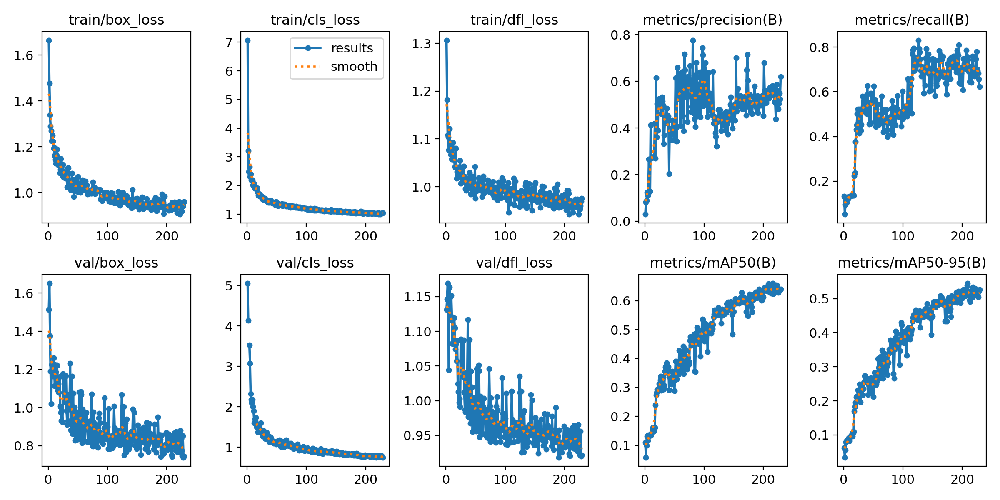


Displaying: confusion_matrix.png


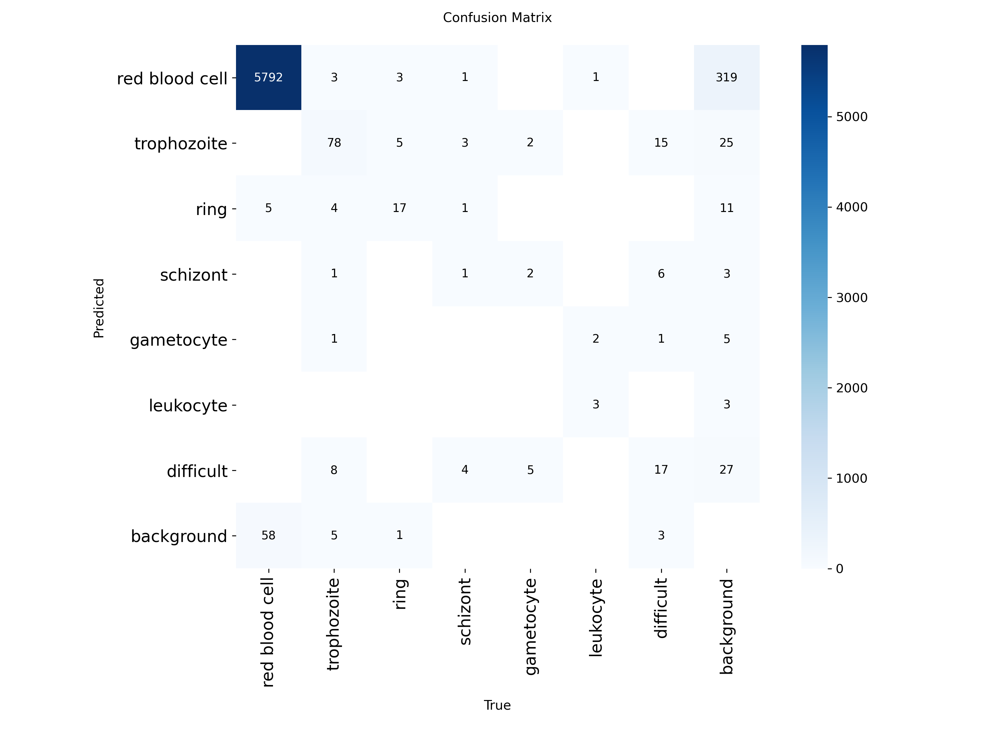


Displaying: labels.jpg


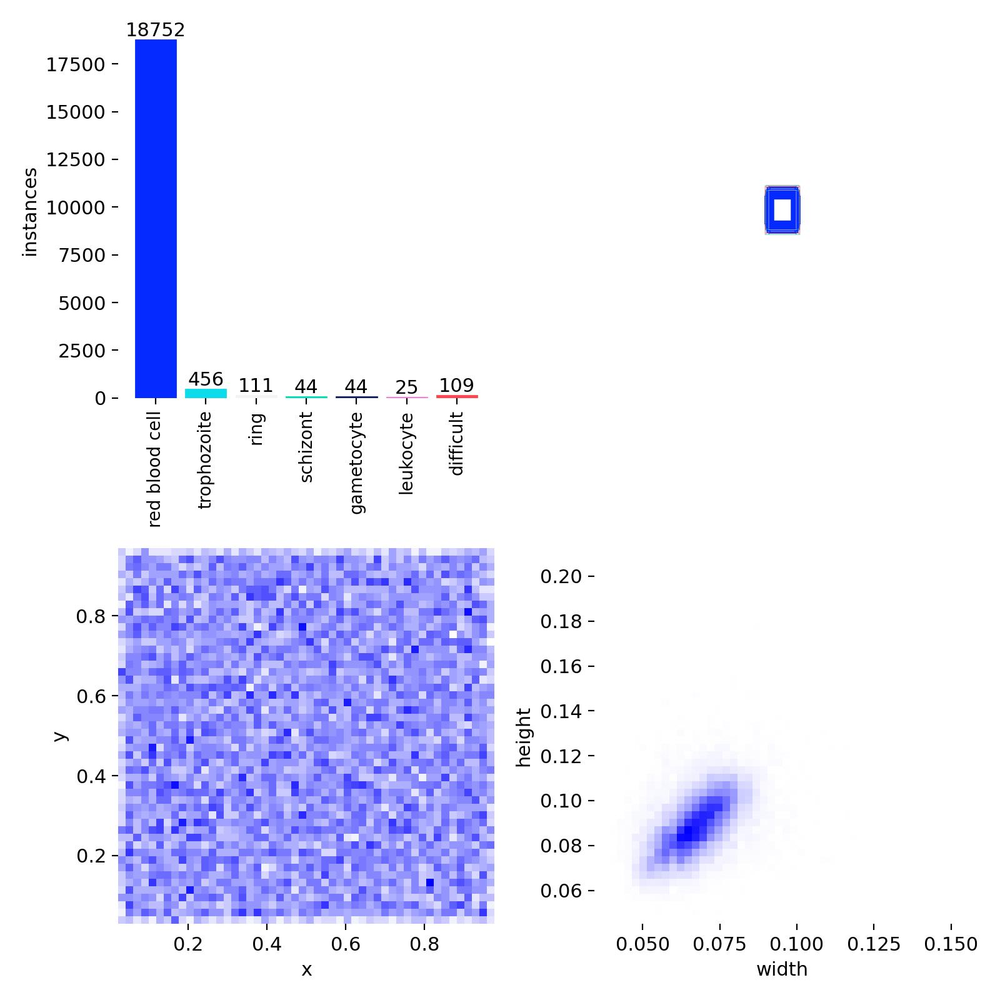


Displaying: val_batch0_pred.jpg


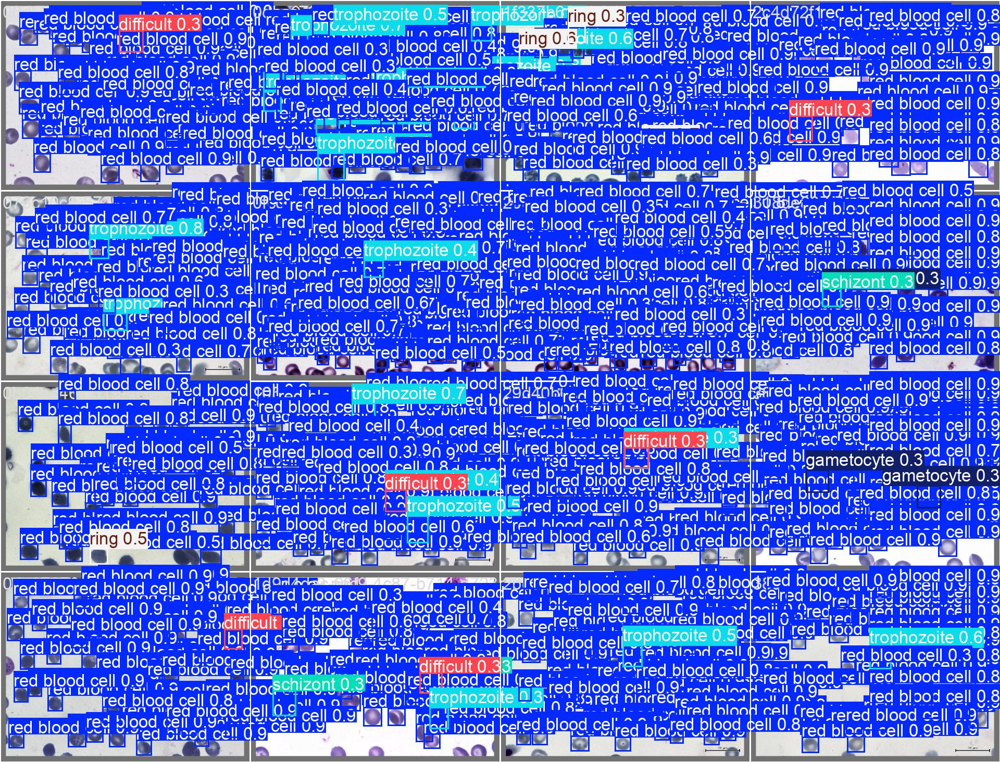


Displaying: val_batch0_labels.jpg


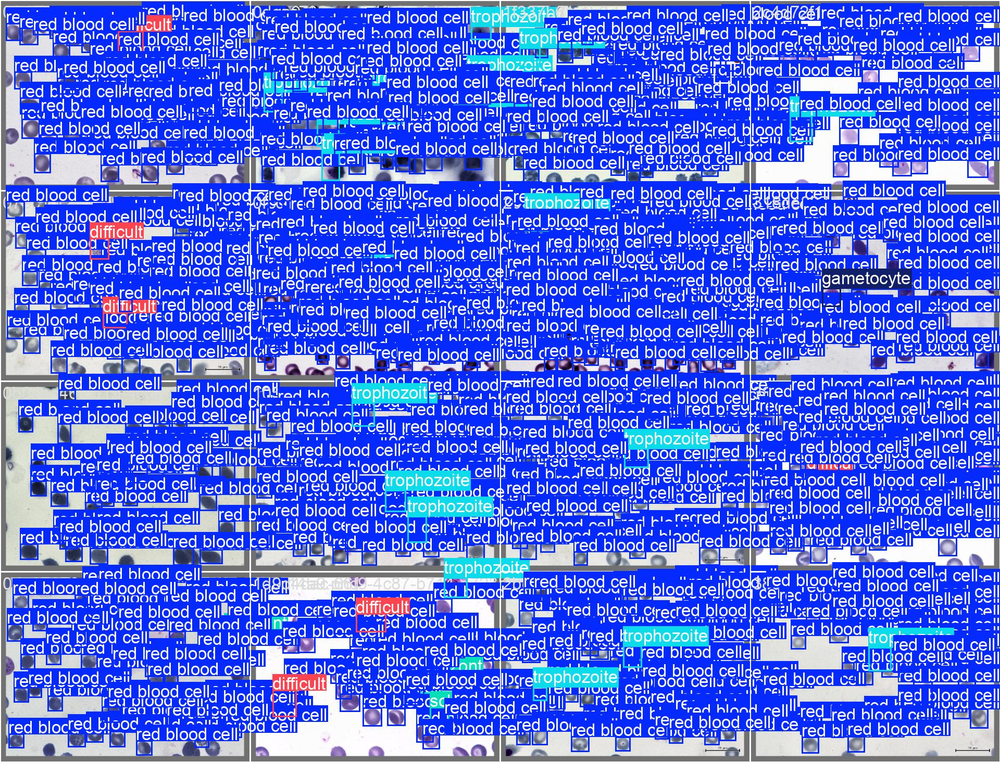

In [7]:
import matplotlib.pyplot as plt
import os
from IPython.display import Image, display

# Define the directory where training results were saved
save_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria_yolov8n_train_results'
run_name = 'malaria_yolov8n_train_1' # Assuming this is the run you want to visualize

results_dir = os.path.join(save_dir, run_name)

print(f"Attempting to display plots from: {results_dir}")

# List potential plot files
plot_files = [
    'results.png', # Training loss and metrics over epochs
    'confusion_matrix.png', # Confusion matrix
    'labels.jpg', # Visualization of labels
    'val_batch0_pred.jpg', # Example predictions on a validation batch
    'val_batch0_labels.jpg' # Corresponding labels for the validation batch
]

displayed_plots = 0
for plot_file in plot_files:
    plot_path = os.path.join(results_dir, plot_file)
    if os.path.exists(plot_path):
        print(f"\nDisplaying: {plot_file}")
        try:
            display(Image(plot_path))
            displayed_plots += 1
        except Exception as e:
            print(f"Error displaying {plot_file}: {e}")
    else:
        print(f"Plot file not found: {plot_file}")

if displayed_plots == 0:
    print("\nNo training plots found in the specified directory.")
    print(f"Please check if the training run '{run_name}' completed successfully and saved results to '{results_dir}'.")

- Losses are decreasing (both train & val). Therefore, the model is learning useful features. There is no overfitting — because validation curves decrease alongside training curves.
- Precision and recall are improving. The model is correctly learning to find the objects and classify them.
- mAP50 peaks ~0.55 & mAP50-95 peaks ~0.35–0.45. This indicates the model is detecting objects reasonably well when IoU threshold is easy (0.5) but struggles when the box needs to be very accurate (mAP50–95).
- This pattern is expected when class imbalance exists (rare parasite stages are underrepresented)
- From the confusion matrix, parasite stages are being confused with each other and also with RBC class. Rare classes are underfitting so needed more samples. Also model is struggling to see small objects. Consider increasing resolution.


---------------------------

Likely errors:
- class imbalance - minority classes (schizont, gametocyte) have very few examples
- interclass confusion - "difficult", "ring", "trophozoite", and "schizont" often share overlapping visual characteristics. The lower precision for these suggests false positives between them.
- Bounding box noise - Low mAP50–95 for smaller classes implies inaccurate bounding box regression, possibly due to overlapping cells

--------------------------
**Improvements to model**
- Increase image size: 1024 or 1536
- Consider adding custom anchors
- Relook augmentations and see if they were appropriate for the type of image dataset. Possible that mosaic, mixup and copy_paste augmentations are affecting detection of small rare objects such as the parasite stages.
- Try reduce mosaic = 0.3, mixup=0.0 & copy_paste=0.1
- Include class_weights='cls_weights'
- Consider class merging (if biologically valid) into a single “infected cell” class for detection first for all classes for different lifecycle stages.

### **1.7.2 2nd Train**

Will resume training from the best model and change the parameters.

#### create custom anchors

Reading label files from: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels/train
Found 300 label files.
Extracted dimensions for 19541 bounding boxes.


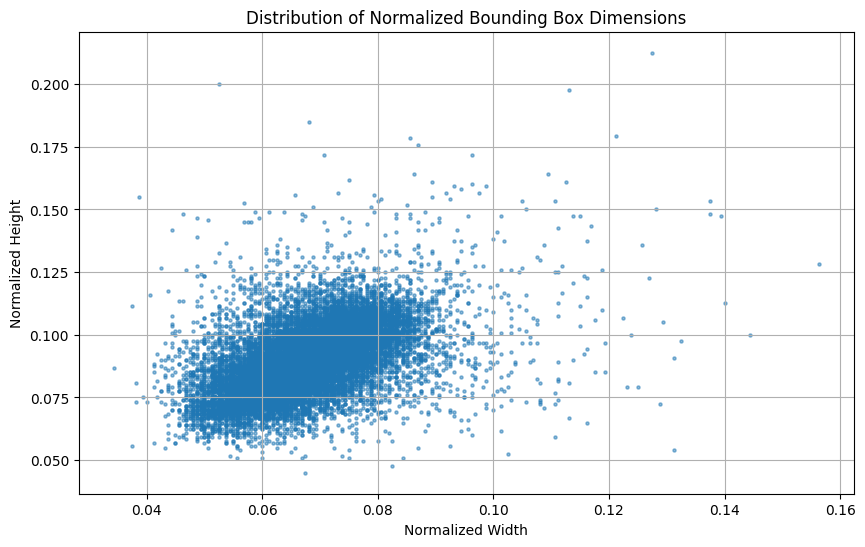


Performing K-means clustering with 9 clusters...

Generated Cluster Anchor Dimensions (Normalized Width, Normalized Height):
Anchor 1: Normalized Width=0.057382, Normalized Height=0.070193, Normalized Area=0.004028
Anchor 2: Normalized Width=0.058108, Normalized Height=0.082348, Normalized Area=0.004785
Anchor 3: Normalized Width=0.069624, Normalized Height=0.081315, Normalized Area=0.005662
Anchor 4: Normalized Width=0.064961, Normalized Height=0.091773, Normalized Area=0.005962
Anchor 5: Normalized Width=0.074465, Normalized Height=0.096177, Normalized Area=0.007162
Anchor 6: Normalized Width=0.065823, Normalized Height=0.109173, Normalized Area=0.007186
Anchor 7: Normalized Width=0.093258, Normalized Height=0.086150, Normalized Area=0.008034
Anchor 8: Normalized Width=0.080404, Normalized Height=0.107373, Normalized Area=0.008633
Anchor 9: Normalized Width=0.087589, Normalized Height=0.140353, Normalized Area=0.012293


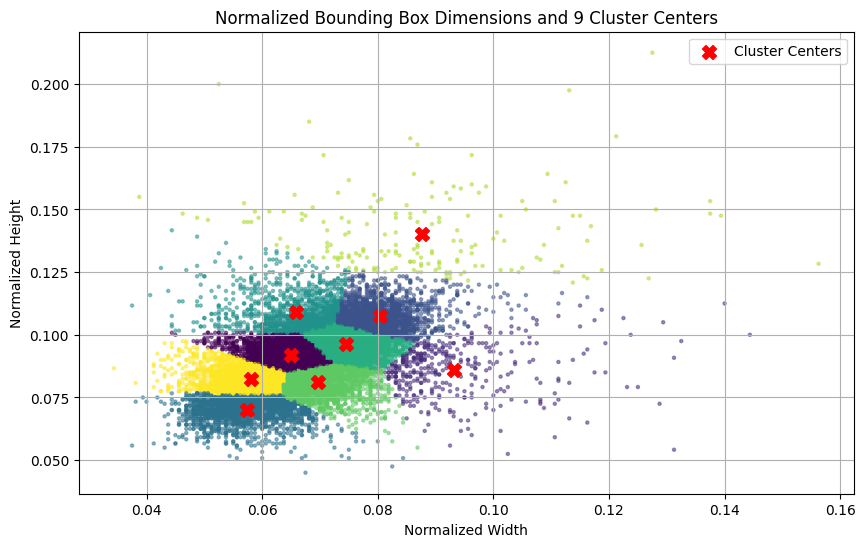

In [9]:
# # generate custom anchors using kmeans clustering
# import numpy as np
# from sklearn.cluster import KMeans
# import os
# import matplotlib.pyplot as plt

# # Define the directory containing your YOLO format training label files (.txt files)
# train_label_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/labels/train' # Path to the directory with .txt labels

# # Extract bounding box dimensions (width, height) from YOLO .txt files
# bbox_dimensions = []
# if os.path.exists(train_label_dir):
#     print(f"Reading label files from: {train_label_dir}")
#     label_files = [f for f in os.listdir(train_label_dir) if f.endswith('.txt')]
#     print(f"Found {len(label_files)} label files.")

#     if label_files:
#         for label_file in label_files:
#             label_path = os.path.join(train_label_dir, label_file)
#             try:
#                 with open(label_path, 'r') as f:
#                     for line in f:
#                         parts = line.strip().split()
#                         # YOLO format is class_id center_x center_y width height (all normalized)
#                         # We need the absolute width and height to cluster.
#                         # To get absolute dimensions, we need the image dimensions.
#                         # However, K-means clustering for anchors is typically done on normalized width and height for scale invariance.
#                         # So, we will extract the normalized width and height directly from the .txt file.
#                         if len(parts) == 5:
#                             # class_id = int(parts[0]) # not needed for anchor calculation
#                             # center_x_norm = float(parts[1])
#                             # center_y_norm = float(parts[2])
#                             width_norm = float(parts[3])
#                             height_norm = float(parts[4])

#                             # Ensure dimensions are positive and within reasonable bounds (0 to 1)
#                             if 0 < width_norm <= 1 and 0 < height_norm <= 1:
#                                 bbox_dimensions.append([width_norm, height_norm])
#             except Exception as e:
#                 print(f"Error reading label file {label_file}: {e}")

#         print(f"Extracted dimensions for {len(bbox_dimensions)} bounding boxes.")

#         if bbox_dimensions:
#             # Convert to a numpy array
#             bbox_dimensions = np.array(bbox_dimensions)

#             # Optional: Visualize the distribution of bounding box dimensions
#             plt.figure(figsize=(10, 6))
#             plt.scatter(bbox_dimensions[:, 0], bbox_dimensions[:, 1], alpha=0.5, s=5)
#             plt.xlabel("Normalized Width")
#             plt.ylabel("Normalized Height")
#             plt.title("Distribution of Normalized Bounding Box Dimensions")
#             plt.grid(True)
#             plt.show()


#             # Perform K-means clustering
#             # Choose the number of clusters (anchors). A common choice for YOLO is 9.
#             n_clusters = 9
#             print(f"\nPerforming K-means clustering with {n_clusters} clusters...")

#             try:
#                 kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10) # Added n_init
#                 kmeans.fit(bbox_dimensions)
#                 cluster_centers = kmeans.cluster_centers_

#                 print("\nGenerated Cluster Anchor Dimensions (Normalized Width, Normalized Height):")
#                 # Sort centers by area for better readability
#                 sorted_centers = sorted(cluster_centers, key=lambda x: x[0] * x[1])
#                 for i, center in enumerate(sorted_centers):
#                     print(f"Anchor {i+1}: Normalized Width={center[0]:.6f}, Normalized Height={center[1]:.6f}, Normalized Area={center[0]*center[1]:.6f}")

#                 # Optional: Visualize cluster centers
#                 plt.figure(figsize=(10, 6))
#                 plt.scatter(bbox_dimensions[:, 0], bbox_dimensions[:, 1], c=kmeans.labels_, alpha=0.5, s=5)
#                 plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', s=100, marker='X', label='Cluster Centers')
#                 plt.xlabel("Normalized Width")
#                 plt.ylabel("Normalized Height")
#                 plt.title(f"Normalized Bounding Box Dimensions and {n_clusters} Cluster Centers")
#                 plt.legend()
#                 plt.grid(True)
#                 plt.show()


#             except Exception as e:
#                 print(f"An error occurred during K-means clustering: {e}")

#         else:
#             print("No valid bounding box dimensions extracted from label files.")

#     else:
#         print("No .txt label files found in the training label directory.")

# else:
#     print(f"Error: Training label directory not found at {train_label_dir}")

In [10]:
# # create anchor.yaml
# import yaml
# import os

# # Define the path to save the new anchors YAML file
# base_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria'
# anchors_yaml_path = os.path.join(base_dir, 'anchors.yaml')

# # Assuming cluster_centers variable is available from the previous cell's execution
# if 'cluster_centers' in locals() and cluster_centers is not None:
#     # Convert cluster_centers (numpy array) to a list of lists for YAML compatibility
#     # Round to a few decimal places for cleaner representation
#     anchors_list = [[round(w, 6), round(h, 6)] for w, h in cluster_centers]

#     print("Calculated anchors (normalized width, normalized height):")
#     print(anchors_list)

#     # Create a dictionary to save to the YAML file
#     # You can structure this as needed, e.g., a simple list or nested under a key
#     anchors_data = {'anchors': anchors_list}

#     # Save the new anchors YAML file
#     try:
#         with open(anchors_yaml_path, 'w') as f:
#             yaml.dump(anchors_data, f, default_flow_style=False)
#         print(f"✅ Anchors saved to new YAML file: {anchors_yaml_path}")

#     except Exception as e:
#         print(f"An error occurred while saving the anchors YAML file: {e}")

# else:
#     print("Error: 'cluster_centers' not found. Please run the cell to calculate anchors first.")
#     anchors_list = [] # Initialize an empty list if anchors are not available

# # You can optionally print the content of the new YAML file to verify
# try:
#     with open(anchors_yaml_path, 'r') as f:
#         anchors_yaml_content = f.read()
#     print("\n--- Content of anchors.yaml ---")
#     print(anchors_yaml_content)
# except FileNotFoundError:
#     pass # Already handled above
# except Exception as e:
#     print(f"Error reading anchors.yaml: {e}")

Calculated anchors (normalized width, normalized height):
[[np.float64(0.064961), np.float64(0.091773)], [np.float64(0.093258), np.float64(0.08615)], [np.float64(0.080404), np.float64(0.107373)], [np.float64(0.057382), np.float64(0.070193)], [np.float64(0.065823), np.float64(0.109173)], [np.float64(0.074465), np.float64(0.096177)], [np.float64(0.069624), np.float64(0.081315)], [np.float64(0.087589), np.float64(0.140353)], [np.float64(0.058108), np.float64(0.082348)]]
✅ Anchors saved to new YAML file: /content/drive/MyDrive/malaria_dataset_4/malaria/malaria/anchors.yaml

--- Content of anchors.yaml ---
anchors:
- - !!python/object/apply:numpy._core.multiarray.scalar
    - &id001 !!python/object/apply:numpy.dtype
      args:
      - f8
      - false
      - true
      state: !!python/tuple
      - 3
      - <
      - null
      - null
      - null
      - -1
      - -1
      - 0
    - !!binary |
      7fSDukihsD8=
  - !!python/object/apply:numpy._core.multiarray.scalar
    - *id001
    -

#### Resume model training

In [ ]:
# Step 1: Import dependencies
from ultralytics import YOLO
import torch
import os
import pandas as pd

# Step 1: Define paths
yaml_path = '/content/drive/MyDrive/malaria_dataset_4/malaria/malaria/malaria_dataset_4.yaml'
save_dir = '/content/drive/MyDrive/malaria_dataset_4/malaria_yolov8n_train_results'
run_name = 'malaria_yolov8n_train_2' # New run name for the second training session

# Step 2: Load the best model from the previous training run
# Assuming the best model is saved as 'best.pt' in the previous run's directory
previous_run_dir = os.path.join(save_dir, 'malaria_yolov8n_train_1') # Path to the first training run directory
best_model_path = os.path.join(previous_run_dir, 'weights', 'best.pt')

try:
    model = YOLO(best_model_path)
    print(f"Successfully loaded model from {best_model_path}")
except FileNotFoundError:
    print(f"Error: Best model not found at {best_model_path}. Please check the path.")
    # Fallback or exit if the best model is not found
    model = None
except Exception as e:
    print(f"An error occurred loading the model: {e}")
    model = None

if model:
    # Step 4: Continue training with adjusted hyperparameters
    results = model.train(
        data=yaml_path,          # path to dataset YAML file (defines classes & image paths)
        imgsz=1024,              # input image size
        epochs=300,              # number of runs (can be adjusted for fine-tuning)
        batch=16,                # number of images per batch
        lr0=0.001,
        device=0,                # use GPU 0
        optimizer='AdamW',       # AdamW - Adam with decoupled Weight decay
        mosaic=0.3,              # data augmentation reduced to 0.3 from 1.0
        mixup=0.0,               # augmentation removed, was 0.5
        copy_paste=0.1,          # augmentation reduced from 0.5
        multi_scale=True,        # random image resizing
        hsv_h=0.03,              # augmentation: hue shift
        hsv_s=1.0,               # augmentation: saturation shift
        hsv_v=0.7,               # augmentation: brightness shift
        degrees=10.0,            # augmentation: random rotation
        translate=0.1,           # augmentation: random translation
        scale=0.5,               # augmentation: random scaling
        shear=2.0,               # augmentation: random shearing
        perspective=0.0005,      # augmentation: random perspective
        flipud=0.5,              # augmentation: random flip up-down
        fliplr=0.5,              # augmentation: random flip left-right
        project=save_dir,        # base directory to save training results
        name=run_name,           # folder name for this run
        exist_ok=True,           # allows reusing folder if it exists
        verbose=True,            # print detailed logs during training
        cls=True,                # turn on class loss
        class_weights="cls_weights", # enable YAML class weights
        patience=50              # Increased patience for potentially longer fine-tuning convergence
    )

    print("\nTraining complete.\n")

    # ✅ Verify whether class weights were actually applied
    print("Using class weights:", model.cfg.get("class_weights", "❌ NOT ACTIVE"))

else:
    print("Model not loaded. Skipping training.")